In [7]:
"""
Demo for the Caldeira-Legget master equation
"""
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from caldeira_legget_master_eq import CaldeiraLeggetMEq, np
from matplotlib.animation import PillowWriter
from IPython.display import HTML, display


In [9]:
class VisualizeDynamicsPhaseSpace:
    """
    Class to visualize the Wigner function function dynamics in phase space
    within the Caldeira-Legget master equation
    """
    def __init__(self, fig):
        """
        Initialize all propagators and frame
        :param fig: matplotlib figure object
        """
        #  Initialize systems
        self.set_quantum_sys()

        #################################################################
        #
        # Initialize plotting facility
        #
        #################################################################

        self.fig = fig

        ax = fig.add_subplot(111)

        ax.set_title('Wigner function, $W(x,p,t)$')
        extent = [self.quant_sys.x.min(), self.quant_sys.x.max(), self.quant_sys.p.min(), self.quant_sys.p.max()]

        # import utility to visualize the wigner function
        from wigner_normalize import WignerNormalize

        # generate empty plot
        self.img = ax.imshow(
            [[]],
            extent=extent,
            origin='lower',
            cmap='seismic',
            norm=WignerNormalize(vmin=-0.01, vmax=0.1)
        )

        self.fig.colorbar(self.img)

        ax.set_xlabel('$x$ (a.u.)')
        ax.set_ylabel('$p$ (a.u.)')

    def set_quantum_sys(self):
        """
        Initialize quantum propagator
        :param self:
        :return:
        """
        omega = 1.
        gamma = 1e-1

        self.quant_sys = CaldeiraLeggetMEq(
            t=0,

            dt=0.05,

            D=1e-1,
            gamma=gamma,

            x_grid_dim=256,
            x_amplitude=10.,

            p_grid_dim=256,
            p_amplitude=10.,

            # kinetic energy part of the hamiltonian
            k=lambda p: 0.5 * p ** 2,

            # potential energy part of the hamiltonian
            v=lambda x: 0.5 * (omega * x) ** 2,

            # these functions are used for evaluating the Ehrenfest theorems
            x_rhs=lambda p: p,
            p_rhs=lambda x, p: -omega ** 2 * x - 2. * gamma * p,
        )

        # set randomised initial condition
        sigma = np.random.uniform(1., 3.)
        p0 = np.random.uniform(-3., 3.)
        x0 = np.random.uniform(-3., 3.)

        self.quant_sys.set_wignerfunction(
            lambda x, p: np.exp(-sigma * (x - x0) ** 2 - (1. / sigma) * (p - p0) ** 2)
        )

    def __call__(self, frame_num):
        """
        Draw a new frame
        :param frame_num: current frame number
        :return: image objects
        """
        # propagate the wigner function
        self.img.set_array(self.quant_sys.wignerfunction)
        self.quant_sys.propagate(20)
        return self.img,


plt.figure(dpi=350)
fig = plt.gcf()
visualizer = VisualizeDynamicsPhaseSpace(fig)
animation = FuncAnimation(
    fig, visualizer, frames=np.arange(100), repeat=True, blit=True
)
display(HTML(animation.to_jshtml()))
# plt.show()
plt.close()


Hamiltonian is preserved within the accuracy of 89.96 percent


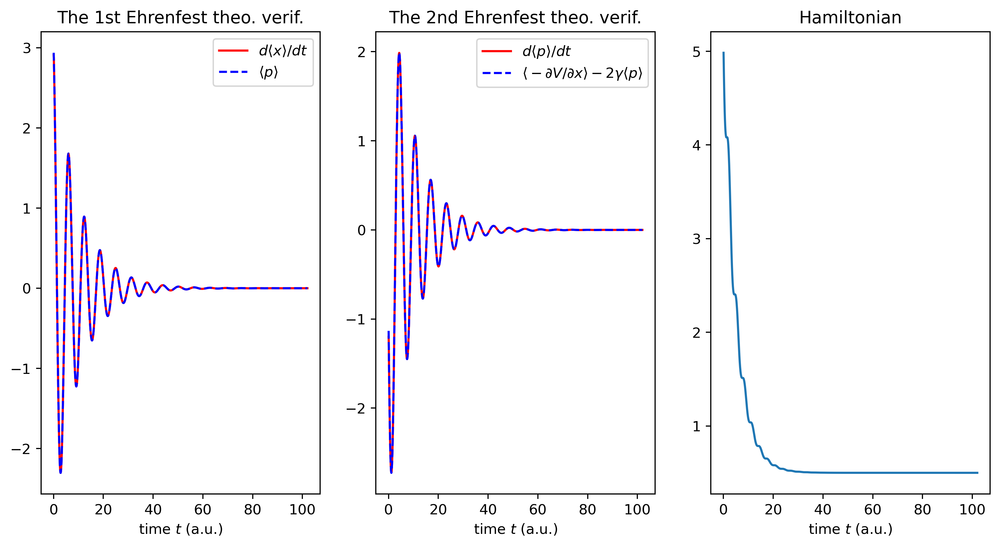

In [12]:
# extract the reference to quantum system
quant_sys = visualizer.quant_sys

# Analyze how well the energy was preseved
h = np.array(quant_sys.hamiltonian_average)
print(
    "\nHamiltonian is preserved within the accuracy of {:.2f} percent".format(
        (1. - h.min() / h.max()) * 100
    )
)

#################################################################
#
# Plot the Ehrenfest theorems after the animation is over
#
#################################################################

# generate time step grid
dt = quant_sys.dt
times = quant_sys.times

plt.figure(figsize=(12,6),dpi=350)
plt.subplot(131)
plt.title("The 1st Ehrenfest theo. verif.")

plt.plot(times, np.gradient(quant_sys.x_average, dt), 'r-', label='$d\\langle x \\rangle/dt$')
plt.plot(times, quant_sys.x_average_rhs, 'b--', label='$\\langle p \\rangle$')

plt.legend()
plt.xlabel('time $t$ (a.u.)')

plt.subplot(132)
plt.title("The 2nd Ehrenfest theo. verif.")

plt.plot(times, np.gradient(quant_sys.p_average, dt), 'r-', label='$d\\langle p \\rangle/dt$')
plt.plot(times, quant_sys.p_average_rhs, 'b--', label='$\\langle -\\partial V/\\partial x \\rangle - 2\gamma \\langle p \\rangle$')

plt.legend()
plt.xlabel('time $t$ (a.u.)')

plt.subplot(133)
plt.title('Hamiltonian')
plt.plot(times, h)
plt.xlabel('time $t$ (a.u.)')

plt.show()